In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from IPython.display import display

## 1a)

$N=10^4$ particles

On a 200x200 grid with uniformly distributed random initial positions and periodic boundary conditions.

We will plot:

- particle trajectories on a 2D plane.

- avg distance travelled vs number of time steps

First we have the function "Brownian" which gives the trajectories of length num_steps for N particles with and without periodic boundary conditions. We need the trajectories without boundary conditions for later calculations of the distance travelled.

In [4]:
def Brownian(N, num_steps):
    '''Accepts number of particles (N) and number of time steps (num_steps)'''
    '''Returns 2 arrays of trajectories for N particles'''
    '''traj is the trajectory without periodic boundary conditions'''
    '''traj_adj is the trajectory with periodic boundary conditions'''
    
    
    # Specify max x and y distance from grid center (0,0)
    gridspace = 100
    
    # initialize random starting position for N particles
    traj = np.zeros((num_steps,N,2))
    traj_adj = np.zeros((num_steps,N,2)) # adjusted for periodic boundary conditions
    traj[0] = np.random.default_rng().integers(-gridspace,gridspace+1,(N,2))
    traj_adj[0] = traj[0]
    
    # loop over time steps
    for i in range(1,num_steps):
        # pick a random direction for the particle to step
        move = np.random.default_rng().integers(-1,2,(N,2))
        
        # calculate new position
        new_pos = traj[i-1] + move
        new_pos_adj = traj_adj[i-1] + move
      
        new_pos_adj.T[0][new_pos_adj.T[0] > gridspace] -= 2*gridspace
        new_pos_adj.T[0][new_pos_adj.T[0] < -gridspace] += 2*gridspace
        new_pos_adj.T[1][new_pos_adj.T[1] > gridspace] -= 2*gridspace
        new_pos_adj.T[1][new_pos_adj.T[1] < -gridspace] += 2*gridspace

        
        # update trajectory
        traj[i] = new_pos
        traj_adj[i] = new_pos_adj 
    return traj.T, traj_adj.T

Use the function Brownian to get trajectories for $10^4$ particles with 300 time steps and visualize trajectories by differentiating particle trajectories by colour.

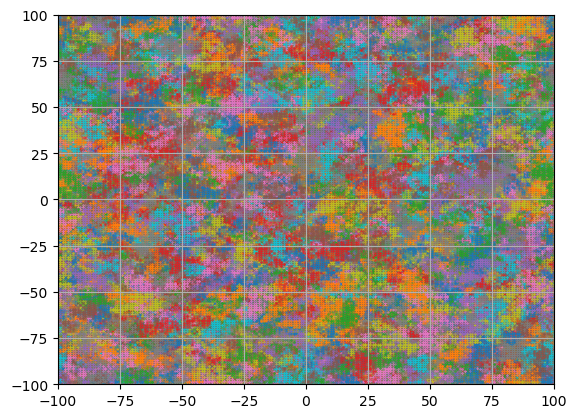

In [15]:
N = 10**4
traj, traj_adj = Brownian(N,300)

plt.xlim(-100,100)
plt.ylim(-100,100)
plt.grid()

for i in range(N):
    plt.scatter(traj_adj[0][i],traj_adj[1][i],s=0.1)

Now we calculate the average distance travelled by N particles using the function Calc_distance

In [44]:
# Calculate difference in position
def Calc_distance(traj):
    '''Accepts a trajectory'''
    '''Returns the distance travelled by subtracting final position from initial'''
    position_diff = traj.T[0]-traj.T[-1]
    distance_travelled = np.mean(np.linalg.norm(position_diff,axis=1))
    return distance_travelled

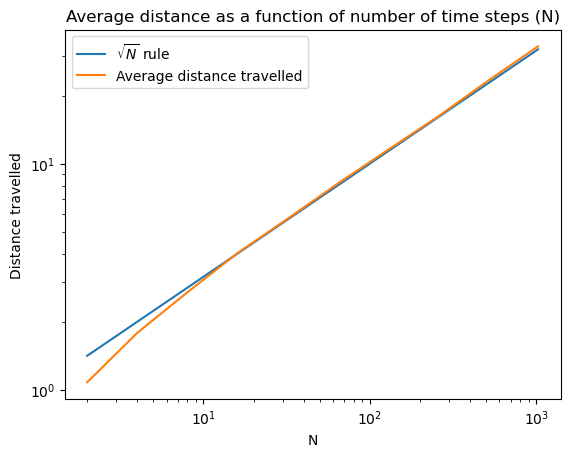

In [46]:
# specify range of powers for number of steps (num_steps = 8**s)
s = 10
num_steps_ranges = 2**(np.arange(1,s+1))

# initialize array for distance travelled
d = np.empty(s)

for i in range(s):
    
    # Get number of steps
    num_steps = num_steps_ranges[i]
    
    # specify number of particles
    N = 10**4 
    
    # Get trajectories
    traj, traj_adj = Brownian(N,num_steps)
    
    # Calculate average distance travelled
    d[i] = Calc_distance(traj)

plt.title('Average distance as a function of number of time steps (N)')
plt.loglog(num_steps_ranges,np.sqrt(num_steps_ranges),label='$\sqrt{N}$ rule')
plt.loglog(num_steps_ranges,d,label='Average distance travelled')
plt.xlabel('N')
plt.ylabel('Distance travelled')
plt.legend()

We see that the average distance travelled by the particles follows the $\sqrt{N}$ law which is as expected for a random walk.

## 1b)

At position (0,0) there is a seed of stationary solid particles (shown in red) in a sea of liquid particles (shown in blue). 

We have several functions for simulating crystallization from the seed:

- Seed: gives coordinates of solid particles in a seed in the shape of a square
- Freezing_zone: gives coordinates for areas neighbouring solid particles where freezing may occur
- view1D: locates where current particle positions overlap with the freezing zone

Together, these functions contribute to the function "Crystal" which has the following procedure:
- Initializes particle positions and sets certain particles to solid using "Seed"
- The state of the particle is kept track of with a "mobility array" which assigns 1 to liquid particles (high mobility) and 0 to solid particles (0 mobility)
- Iterates through time steps and chooses a random direction for each particle to move in. This decision has no effect on solid particles as they have mobility = 0
- The new positions are compared to the freezing zone using "view1D"
- In the case of overlap, the mobility values for those particles are set to 0
- Iterate until 80% of particles are solid

In [8]:
def Seed(s):
    '''Accepts seed radius (s)'''
    '''Returns seed array '''
    x = np.arange(-s,s+1)
    y = -np.arange(-s,s+1)
    xy = np.asarray(np.meshgrid(x,y))
    seed = xy.T.reshape((2*s+1)**2,2)
    return seed

def Freezing_zone(s_zone,gridspace):
    '''Accepts array of coords of solid particles (s_zone)'''
    '''and max possible coordinate value (gridspace)'''
    '''Returns array of neighbouring coords where freezing can occur'''
    
    f_zone = s_zone
    
    # set up matrix for calculating neighbouring positions
    x = np.arange(-1,2)
    y = -np.arange(-1,2)
    xy = np.asarray(np.meshgrid(x,y))
    neighbours = xy.T.reshape(9,2)
    
    # calculate neighbouring positions
    for i in range(9):
        neighbour_coord = s_zone+neighbours[i]
        
        # adjust for periodic boundary conditions
        neighbour_coord.T[0][neighbour_coord.T[0] > gridspace] -= 2*gridspace
        neighbour_coord.T[0][neighbour_coord.T[0] < -gridspace] += 2*gridspace
        neighbour_coord.T[1][neighbour_coord.T[1] > gridspace] -= 2*gridspace
        neighbour_coord.T[1][neighbour_coord.T[1] < -gridspace] += 2*gridspace
        
        f_zone = np.vstack((f_zone,neighbour_coord))
        
    return f_zone

def view1D(a, b): 
    '''Accepts arrays a and b and locates indices where entry in a is present in b'''
    a = np.ascontiguousarray(a)
    b = np.ascontiguousarray(b)
    void_dt = np.dtype((np.void, a.dtype.itemsize * a.shape[1]))
    A,B = a.view(void_dt).ravel(),  b.view(void_dt).ravel()
    return np.isin(A,B)

def Crystal(num_steps):
    '''Accepts number of time steps (num_steps)'''
    '''Returns coords of liquid and solid particles (S_zone,L_zone)'''
    '''Returns the final time step when 80% of particles are solid'''
    
    # Specify max x and y distance from grid center (0,0)
    gridspace = 100
    
    # initialize random starting position for N particles
    N = 10**4
    #traj_adj = np.zeros((num_steps,N,2)) # adjusted for periodic boundary conditions
    coords = np.random.default_rng().integers(-gridspace,gridspace+1,(N,2))
    
    # Place some particles in center for formation of seed crystal of certain radius
    rad = 2
    seed = Seed(rad)
    for i in range((2*rad+1)**2):
        coords[i] = seed[i]
    
    # Set all particles in circle of certain radius to have 0 mobility (aka solid)
    mobility = np.ones(N)
    mobility[np.linalg.norm(coords,axis=1) <= (rad+1)] = 0
    mobility_coeff = np.vstack((mobility,mobility)).T
    
    # Get coordinates of liquid particles
    L_zone = []
    L_zone.append(coords[mobility == 1])
    N_L = np.empty(num_steps)
    N_L[0] = np.sum(mobility)
    
    # Get coordinates and number of solid particles
    S_zone = []
    S_zone.append(coords[mobility == 0])
    N_S = np.empty(num_steps)
    N_S[0] = N-N_L[0]
    
    # Get coordinates of freezing zone
    F_zone = Freezing_zone(S_zone[0],gridspace)
    
    # loop over time steps
    for i in range(1,num_steps):
        # pick a random direction for the particles to step (with mobility adjustment)
        move = np.random.default_rng().integers(-1,2,(N,2))*mobility_coeff
        
        # calculate new position
        new_coords = coords + move
        
        # adjust for periodic boundary conditions
        new_coords.T[0][new_coords.T[0] > gridspace] -= 2*gridspace
        new_coords.T[0][new_coords.T[0] < -gridspace] += 2*gridspace
        new_coords.T[1][new_coords.T[1] > gridspace] -= 2*gridspace
        new_coords.T[1][new_coords.T[1] < -gridspace] += 2*gridspace
        
        # locate particle indices where freezing has occured
        f_indices = view1D(new_coords,F_zone)
        
        # update mobility according to where freezing has occured
        mobility[f_indices] = 0
        mobility_coeff = np.vstack((mobility,mobility)).T
        
        # update coordinates of liquid particles
        L_zone.append(new_coords[mobility == 1])
        N_L[i] = np.sum(mobility)
        
        # update coordinates of solid particles
        S_zone.append(new_coords[mobility == 0])
        N_S[i] = N-N_L[i]
        
        # update coordinates of freezing zone
        F_zone = Freezing_zone(S_zone[i],gridspace)
        
        coords = new_coords
        
        # Stop the simulation once 80% of particles have solidified
        if (N_S[i]/N) >= 0.8:
            final_t = i
            print('final time step', final_t)
            break
        
        
    return S_zone, L_zone, N_S[:final_t], N_L[:final_t], final_t

S_zone, L_zone, N_S, N_L, final_t = Crystal(400)

final time step 368


Display crystal in arbitrary frame

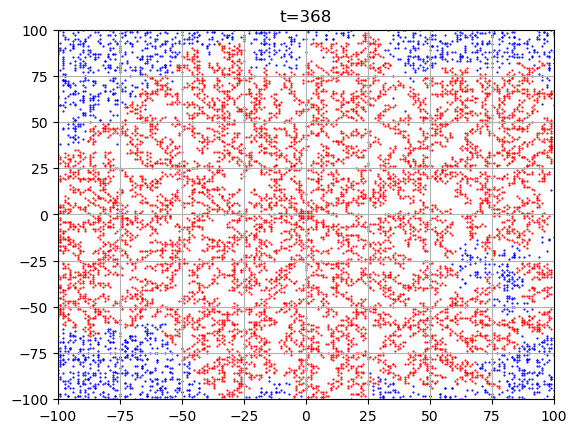

In [9]:
plt.xlim(-100,100)
plt.ylim(-100,100)
plt.grid()
t = final_t
plt.title('t=%i'%t)
plt.scatter(S_zone[t].T[0],S_zone[t].T[1],color = 'red',s=0.3)
plt.scatter(L_zone[t].T[0],L_zone[t].T[1],color = 'blue',s=0.3)

Display crystal growth in a movie

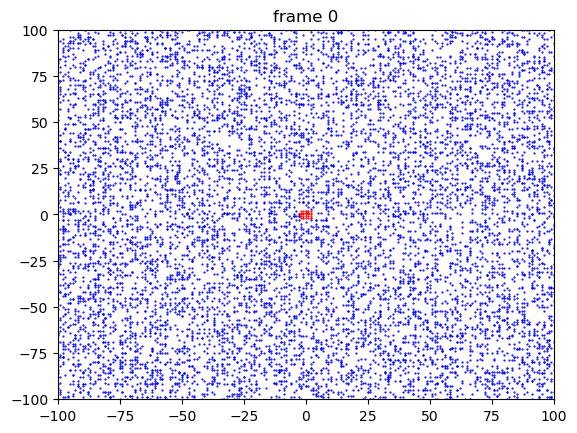

In [11]:

fig, ax = plt.subplots()

scat_S = ax.scatter(S_zone[0].T[0],S_zone[0].T[1],color = 'red',s=0.3)
scat_L = ax.scatter(L_zone[0].T[0],L_zone[0].T[1],color = 'blue',s=0.3)
ax.set(xlim=[-100, 100], ylim=[-100, 100])


def update(frame2):
    frame = frame2*2 # we'll skip every other frame
    
    # update the scatter plot for solids
    x_S = S_zone[frame].T[0]
    y_S = S_zone[frame].T[1]
    data_S = np.stack([x_S, y_S]).T
    scat_S.set_offsets(data_S)
    
    # update the scatter plot for liquids
    x_L = L_zone[frame].T[0]
    y_L = L_zone[frame].T[1]
    data_L = np.stack([x_L, y_L]).T
    scat_L.set_offsets(data_L)
    
    ax.set_title('frame %i'%frame)
    

    return (scat_S, scat_L)

ani = FuncAnimation(fig=fig, func=update, frames=int(final_t/2)-1, interval=12)
display(HTML(ani.to_jshtml()))

## 1c)

We will plot
- The number of solid particles, $N_{solid}$, as a function of number of time steps.

The function Crystal already returns $N_{solid}$ at each time step so we need only plot the results from 1b)

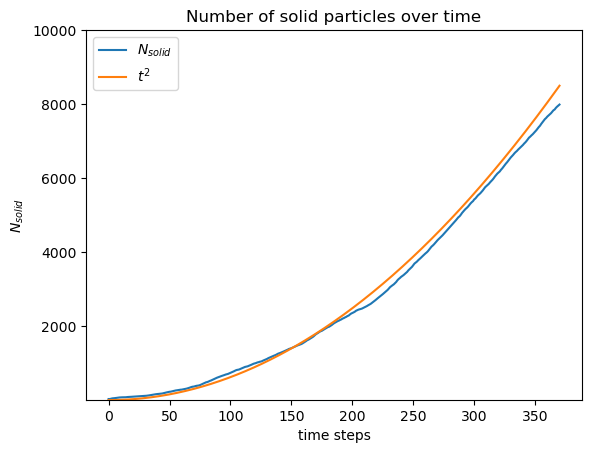

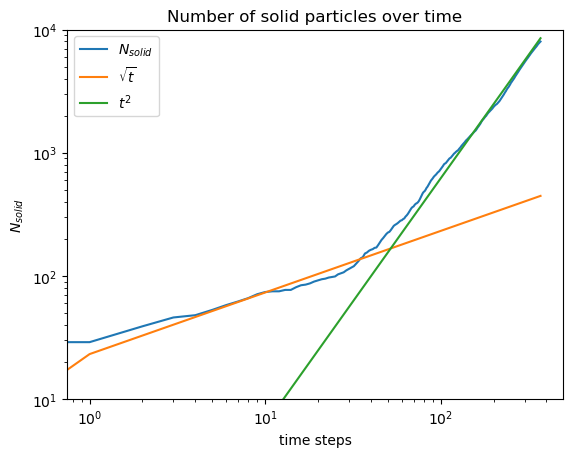

In [81]:
t = np.arange(len(N_S))
rule1 = t**(1/2)*N_S[0]*0.8 # draw a sqrt(t) curve which will guide the eye
rule2 = t**(2)/N_S[0]*1.8 # draw a t^2 curve which will guide the eye

plt.figure(1)
plt.plot(t,N_S,label='$N_{solid}$')
#plt.plot(t,rule1,label='$\sqrt{t}$')
plt.plot(t,rule2,label='$t^2$')
plt.ylim(10,10**4)
plt.title('Number of solid particles over time')
plt.ylabel('$N_{solid}$')
plt.xlabel('time steps')
plt.legend()

plt.figure(2)
plt.loglog(t,N_S,label='$N_{solid}$')
plt.loglog(t,rule1,label='$\sqrt{t}$')
plt.loglog(t,rule2,label='$t^2$')
plt.ylim(10,10**4)
plt.title('Number of solid particles over time')
plt.ylabel('$N_{solid}$')
plt.xlabel('time steps')
plt.legend()

We see that very quickly, $N_{solid}$ follows a $t^2$ rule. This is because as the crystal grows, there is more perimeter for the liquid particles to interact with the solid particles.  For the number of solid particles to be growing quadratically, the area of the dendritic circle must be growing quadratically. This means the radius is growing linearly so the perimeter must also be growing linearly. 